In [33]:
# Import libraries
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import re
from varname import nameof

In [34]:
nutrition = pd.read_csv("../data/Nutritional_values.csv")
nutrition.set_index("name", inplace = True)
nutrition.drop("Unnamed: 0", axis = 1, inplace = True)
nutrition.head()

,serving_size,calories,total_fat,saturated_fat,cholesterol,sodium,choline,folate,folic_acid,niacin,...,fat,saturated_fatty_acids,monounsaturated_fatty_acids,polyunsaturated_fatty_acids,fatty_acids_total_trans,alcohol,ash,caffeine,theobromine,water
name,,,,,,,,,,,,,,,,,,,,,
Cornstarch,100 g,381,0.1g,NaN,0,9.00 mg,0.4 mg,0.00 mcg,0.00 mcg,0.000 mg,...,0.05 g,0.009 g,0.016 g,0.025 g,0.00 mg,0.0 g,0.09 g,0.00 mg,0.00 mg,8.32 g
"Nuts, pecans",100 g,691,72g,6.2g,0,0.00 mg,40.5 mg,22.00 mcg,0.00 mcg,1.167 mg,...,71.97 g,6.180 g,40.801 g,21.614 g,0.00 mg,0.0 g,1.49 g,0.00 mg,0.00 mg,3.52 g
"Eggplant, raw",100 g,25,0.2g,NaN,0,2.00 mg,6.9 mg,22.00 mcg,0.00 mcg,0.649 mg,...,0.18 g,0.034 g,0.016 g,0.076 g,0.00 mg,0.0 g,0.66 g,0.00 mg,0.00 mg,92.30 g
"Teff, uncooked",100 g,367,2.4g,0.4g,0,12.00 mg,13.1 mg,0,0,3.363 mg,...,2.38 g,0.449 g,0.589 g,1.071 g,0,0,2.37 g,0,0,8.82 g
"Sherbet, orange",100 g,144,2g,1.2g,1mg,46.00 mg,7.7 mg,4.00 mcg,0.00 mcg,0.063 mg,...,2.00 g,1.160 g,0.530 g,0.080 g,1.00 mg,0.0 g,0.40 g,0.00 mg,0.00 mg,66.10 g


In [35]:
nutrition.columns

Index(['serving_size', 'calories', 'total_fat', 'saturated_fat', 'cholesterol',
       'sodium', 'choline', 'folate', 'folic_acid', 'niacin',
       'pantothenic_acid', 'riboflavin', 'thiamin', 'vitamin_a',
       'vitamin_a_rae', 'carotene_alpha', 'carotene_beta',
       'cryptoxanthin_beta', 'lutein_zeaxanthin', 'lucopene', 'vitamin_b12',
       'vitamin_b6', 'vitamin_c', 'vitamin_d', 'vitamin_e', 'tocopherol_alpha',
       'vitamin_k', 'calcium', 'copper', 'irom', 'magnesium', 'manganese',
       'phosphorous', 'potassium', 'selenium', 'zink', 'protein', 'alanine',
       'arginine', 'aspartic_acid', 'cystine', 'glutamic_acid', 'glycine',
       'histidine', 'hydroxyproline', 'isoleucine', 'leucine', 'lysine',
       'methionine', 'phenylalanine', 'proline', 'serine', 'threonine',
       'tryptophan', 'tyrosine', 'valine', 'carbohydrate', 'fiber', 'sugars',
       'fructose', 'galactose', 'glucose', 'lactose', 'maltose', 'sucrose',
       'fat', 'saturated_fatty_acids', 'monounsatur

For daily intake:
- **do_have**: protein, water, fiber, vitamin_a, thiamin, riboflavin, niacin, vitamin_b6, vitamin_b12, folate, vitamin_c, calcium, irom, magnesium, potassium, sodium, zink

- **dont_have**: iodine, 

In [61]:
# Filters for columns
macros = ["protein", "carbohydrate", "fat", "calories"]
micros = ["vitamin_a", "vitamin_b12", "vitamin_b6", "vitamin_c", "vitamin_e", "magnesium", "zink", "calcium", "irom", "potassium"]
others = ["fiber", "sugars", "cholesterol"]
fats = ["total_fat", "saturated_fat", "saturated_fatty_acids", "monounsaturated_fatty_acids", "polyunsaturated_fatty_acids"]

l = [macros, micros, others, fats]

# Full filter
full_column_filter = []

for i in l:
    full_column_filter.extend(i)

In [89]:
# More filters for columns

key_nutrients = ["protein", "water", "fiber", "vitamin_a", "thiamin", "riboflavin", "niacin", "vitamin_b6", "vitamin_b12", "folate", "vitamin_c", "calcium", "irom", "magnesium", "potassium", "sodium", "zink"]

In [37]:
# Filters for index (foods)
filter1 = ["Beverages", "supplement", "nutritional"]

# To filter these out, it's as follows: nutrition[beverages == False] --> This gives me the ones that don't contain the word
beverages = nutrition.index.str.contains(filter1[0])
supplements = nutrition.index.str.contains(filter1[1])
nutritional = nutrition.index.str.contains(filter1[2])

In [38]:

def num_cleaning(x):
    try:
        return re.match(r'[\d]*[\.\d]*', x)[0]
    except:
        return x

In [39]:
count = 0
success = 0

for column in nutrition.columns:
    if nutrition[column].dtype == "O":
        try:
            nutrition[column] = nutrition[column].map(num_cleaning)
            success += 1
            count += 1
        except:
            nutrition[column] = nutrition[column]
            count += 1

print(f"{success} out of {count} were succesfully modified")

73 out of 73 were succesfully modified


In [40]:
nutrition.head()

,serving_size,calories,total_fat,saturated_fat,cholesterol,sodium,choline,folate,folic_acid,niacin,...,fat,saturated_fatty_acids,monounsaturated_fatty_acids,polyunsaturated_fatty_acids,fatty_acids_total_trans,alcohol,ash,caffeine,theobromine,water
name,,,,,,,,,,,,,,,,,,,,,
Cornstarch,100,381,0.1,NaN,0,9.00,0.4,0.00,0.00,0.000,...,0.05,0.009,0.016,0.025,0.00,0.0,0.09,0.00,0.00,8.32
"Nuts, pecans",100,691,72,6.2,0,0.00,40.5,22.00,0.00,1.167,...,71.97,6.180,40.801,21.614,0.00,0.0,1.49,0.00,0.00,3.52
"Eggplant, raw",100,25,0.2,NaN,0,2.00,6.9,22.00,0.00,0.649,...,0.18,0.034,0.016,0.076,0.00,0.0,0.66,0.00,0.00,92.30
"Teff, uncooked",100,367,2.4,0.4,0,12.00,13.1,0,0,3.363,...,2.38,0.449,0.589,1.071,0,0,2.37,0,0,8.82
"Sherbet, orange",100,144,2,1.2,1,46.00,7.7,4.00,0.00,0.063,...,2.00,1.160,0.530,0.080,1.00,0.0,0.40,0.00,0.00,66.10


In [41]:
def to_float(x):
    try:
        return float(x)
    except:
        return x

In [42]:
nutrition = nutrition.applymap(to_float)
nutrition.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8789 entries, Cornstarch to Beef, raw, all grades, trimmed to 0" fat, separable lean only, boneless, eye of round steak, round
Data columns (total 75 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   serving_size                 8789 non-null   float64
 1   calories                     8789 non-null   float64
 2   total_fat                    8789 non-null   float64
 3   saturated_fat                7199 non-null   float64
 4   cholesterol                  8789 non-null   float64
 5   sodium                       8789 non-null   float64
 6   choline                      8789 non-null   float64
 7   folate                       8789 non-null   float64
 8   folic_acid                   8789 non-null   float64
 9   niacin                       8789 non-null   float64
 10  pantothenic_acid             8789 non-null   float64
 11  riboflavin                   8789 no

do_have: protein, water, fiber, vitamin_a, thiamin, riboflavin, niacin, vitamin_b6, vitamin_b12, folate, vitamin_c, calcium, irom, magnesium, potassium, sodium, zink

dont_have: iodine, 

In [45]:
# nutrition[beverages == True]

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your c

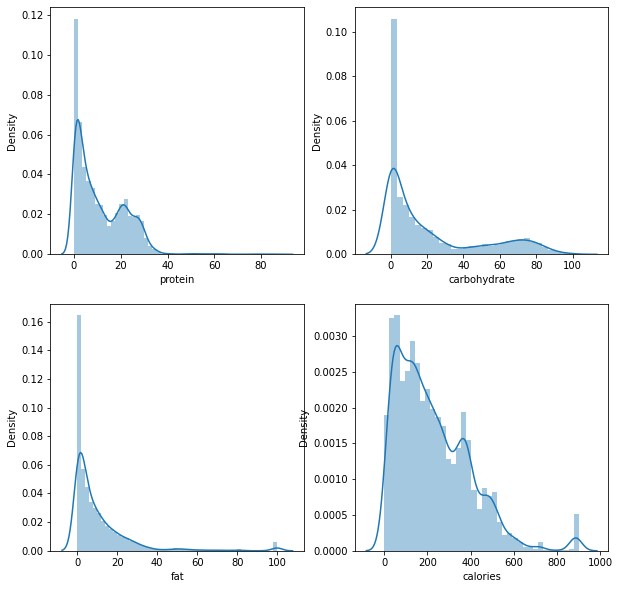

In [62]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize = (10, 10))
axes = [ax1, ax2, ax3, ax4]

for i in range(len(macros)):
    sns.distplot(nutrition[macros[i]], ax = axes[i])

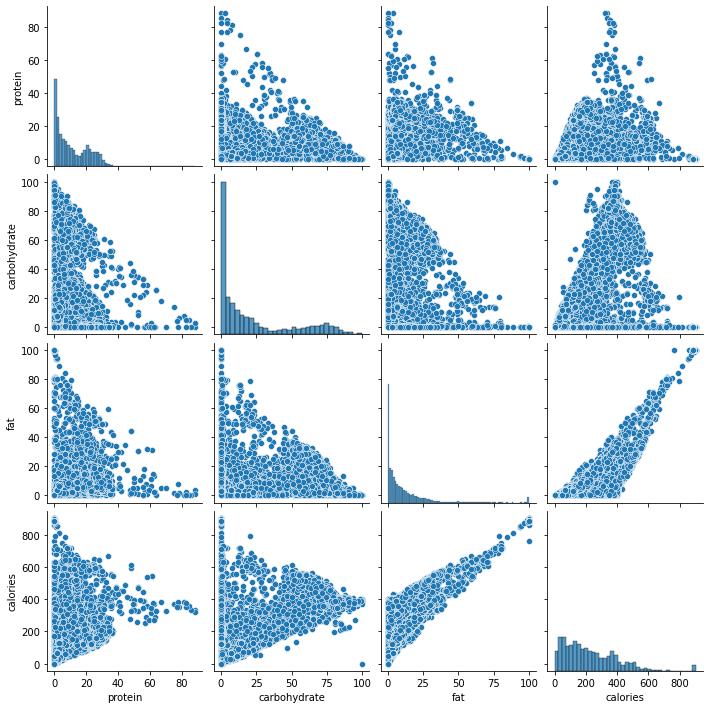

In [63]:
sns.pairplot(nutrition[macros], kind = "scatter")

<AxesSubplot:xlabel='fat', ylabel='saturated_fat'>

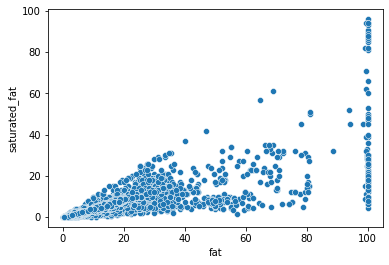

In [69]:
sns.scatterplot(x = nutrition["fat"], y = nutrition["saturated_fat"])

In [73]:
corr = nutrition[full_column_filter].corr()

<AxesSubplot:>

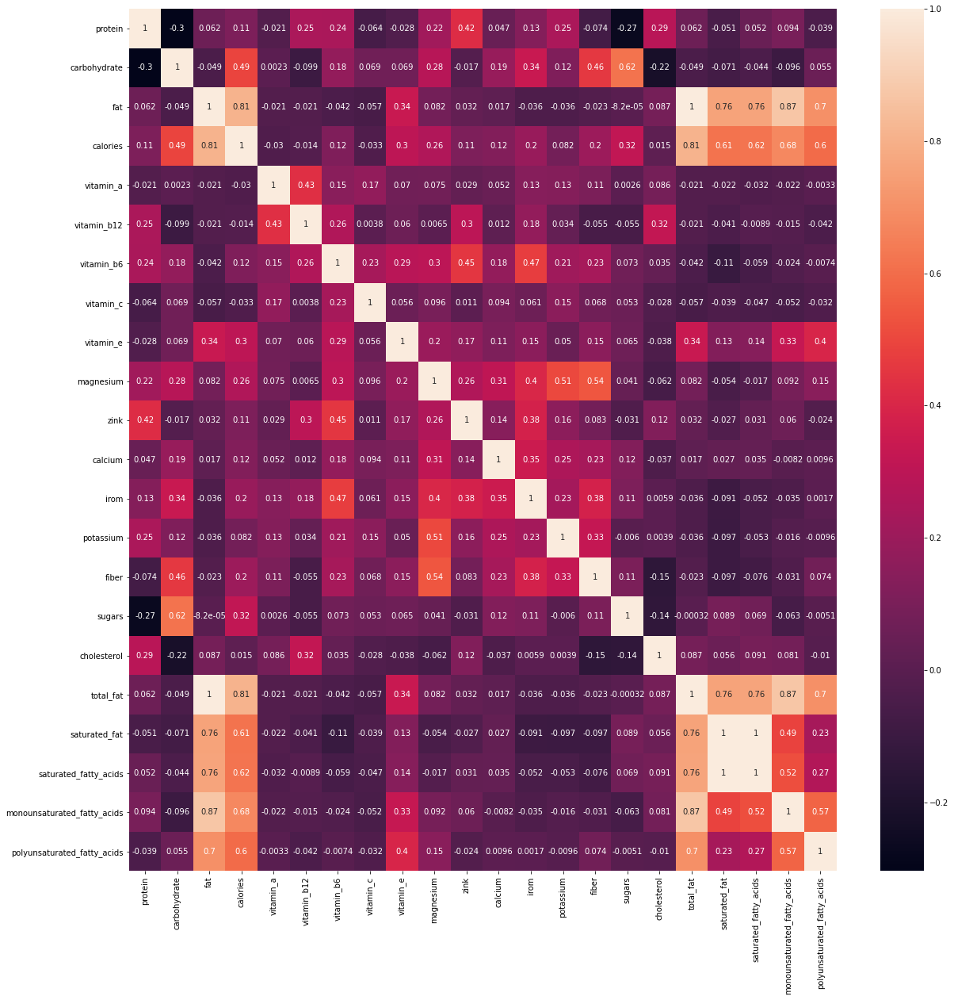

In [76]:
plt.figure(figsize = (20, 20))
sns.heatmap(corr, annot = True)

In [84]:
nutrition[(beverages == False) & (supplements == False) & (nutritional == False)][full_column_filter].sort_values(by = "protein", ascending = False)[:50]

,protein,carbohydrate,fat,calories,vitamin_a,vitamin_b12,vitamin_b6,vitamin_c,vitamin_e,magnesium,...,irom,potassium,fiber,sugars,cholesterol,total_fat,saturated_fat,saturated_fatty_acids,monounsaturated_fatty_acids,polyunsaturated_fatty_acids
name,,,,,,,,,,,,,,,,,,,,,
Soy protein isolate,88.32,0.00,3.39,335.0,0.0,0.00,0.100,0.0,0.00,39.0,...,14.50,81.0,0.0,0.00,0.0,3.4,0.4,0.422,0.645,1.648
"Soy protein isolate, potassium type",88.32,2.59,0.53,321.0,0.0,0.00,0.100,0.0,0.00,39.0,...,14.50,1590.0,0.0,0.00,0.0,0.5,0.1,0.077,0.117,0.299
"Gelatins, unsweetened, dry powder",85.60,0.00,0.10,335.0,0.0,0.00,0.007,0.0,0.00,22.0,...,1.11,16.0,0.0,0.00,0.0,0.1,0.1,0.070,0.060,0.010
"Egg, glucose reduced, stabilized, dried, white",84.08,4.51,0.32,357.0,0.0,0.20,0.032,0.0,0.00,82.0,...,0.18,884.0,0.0,0.00,0.0,0.3,0.1,0.118,0.125,0.045
"Seal, dried (Alaska Native), meat, bearded (Oogruk)",82.60,0.00,2.30,351.0,1310.0,0.00,0.000,0.0,0.00,0.0,...,49.60,0.0,0.0,0.00,0.0,2.3,0.6,0.600,1.330,0.370
"Egg, glucose reduced, stabilized, powder, dried, white",82.40,4.47,0.04,376.0,0.0,0.53,0.024,0.0,0.00,72.0,...,0.24,1116.0,0.0,0.00,0.0,0.0,NaN,0.000,0.000,0.000
"Egg, dried, white",81.10,7.80,0.00,382.0,0.0,0.18,0.036,0.0,0.00,88.0,...,0.15,1125.0,0.0,5.40,0.0,0.0,NaN,0.000,0.000,0.000
"Steelhead trout, flesh (Shoshone Bannock), dried",77.27,0.00,8.06,382.0,213.0,22.40,0.000,0.0,2.41,84.0,...,2.96,1720.0,0.0,0.00,227.0,8.1,0.8,0.829,1.228,1.739
"Egg, glucose reduced, stabilized, flakes, dried, white",76.92,4.17,0.04,351.0,0.0,0.49,0.023,0.0,0.00,67.0,...,0.23,1042.0,0.0,0.00,0.0,0.0,NaN,0.000,0.000,0.000


In [90]:
nutrition[key_nutrients]

,protein,water,fiber,vitamin_a,thiamin,riboflavin,niacin,vitamin_b6,vitamin_b12,folate,vitamin_c,calcium,irom,magnesium,potassium,sodium,zink
name,,,,,,,,,,,,,,,,,
Cornstarch,0.26,8.32,0.9,0.0,0.000,0.000,0.000,0.000,0.00,0.0,0.0,2.0,0.47,3.0,3.0,9.0,0.06
"Nuts, pecans",9.17,3.52,9.6,56.0,0.660,0.130,1.167,0.210,0.00,22.0,1.1,70.0,2.53,121.0,410.0,0.0,4.53
"Eggplant, raw",0.98,92.30,3.0,23.0,0.039,0.037,0.649,0.084,0.00,22.0,2.2,9.0,0.23,14.0,229.0,2.0,0.16
"Teff, uncooked",13.30,8.82,8.0,9.0,0.390,0.270,3.363,0.482,0.00,0.0,0.0,180.0,7.63,184.0,427.0,12.0,3.63
"Sherbet, orange",1.10,66.10,1.3,46.0,0.027,0.097,0.063,0.023,0.13,4.0,2.3,54.0,0.14,8.0,96.0,46.0,0.48
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Beef, raw, all grades, trimmed to 0"" fat, separable lean and fat, boneless, top round roast, round",23.45,72.51,0.0,11.0,0.063,0.234,6.422,0.631,1.64,4.0,0.0,13.0,2.33,12.0,311.0,54.0,3.67
"Lamb, cooked, separable lean only, composite of trimmed retail cuts, frozen, imported, New Zealand",29.59,59.95,0.0,0.0,0.130,0.500,7.680,0.140,2.95,0.0,0.0,13.0,2.35,22.0,188.0,50.0,4.30
"Lamb, raw, separable lean and fat, composite of trimmed retail cuts, frozen, imported, New Zealand",16.74,59.80,0.0,0.0,0.130,0.320,6.550,0.110,2.42,1.0,0.0,13.0,1.49,15.0,136.0,39.0,2.39
